<b>Authors</b>: <i> Mostafa Mahmoud Ibrahim Elsayed Mahmoud (mostafamahmoud.mahmoud@mail.polimi.it), Julia Anna Leonardi (juliaanna.leonardi@mail.polimi.it). Part of the code regarding handling of the PRISMA image was kindly provided by Alberto Vavassori (alberto.vavassori@polimi.it) and Capizzi Emanuele (emanuele.capizzi@polimi.it) - DICA - Politecnico di Milano - GIS GEOLab. </i>

<i>Developed within the LCZ-ODC project, funded by the Italian Space Agency (agreement n. 2022-30-HH.0) </i>

---
# Co-registration of PRISMA imagery with Sentinel-2 imagery through GeFolki algorithm

This notebook is meant to co-register PRISMA imagery (SWIR and NIR data cubes) using Sentinel-2 pre-processed imagery as reference. <br> 
Co-registration is performed using the AROSICS algorithm (https://danschef.git-pages.gfz-potsdam.de/arosics/doc/index.html) which is based on Phase-Correlation in the Frequency Domain of the images.

<a id='TOC_TOP'></a>

The main steps implemented in this notebook are the following: <br>
 1. [opening PRISMA file (provided in .he5 format), reading and extracting image data](#sec1)  
 2. [importing the pre-processed Sentinel-2 image clipped to PRISMA image extent ](#sec2)  
 3. [application of the AROSICS algorithm](#sec3)  
<hr>

## 1. <a id='sec1'></a>Opening PRISMA file, reading and extracting image data

**REQUIREMENT**: installation of [***h5py***](https://docs.h5py.org/en/stable/quick.html) library from command line with `pip install h5py`.
Libraries required for running the code:
- `h5py`
- `numpy`
- `matplotlib`
- `rasterio`
- `os`
- `pylab`
- `ipwidgets`
- `pandas`
- `arosics`

In [81]:
#Import libraries
import h5py
import numpy as np
import rasterio as rio
from rasterio.plot import show
from rasterio.plot import show_hist
from rasterio.warp import reproject, Resampling
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
import pylab as pl
import os
import ipywidgets as widgets
import pandas as pd
from arosics import COREG_LOCAL

Open the file containing the PRISMA image (.he5 file):

In [82]:
f = h5py.File('data/PRISMA/PRS_L2D_STD_20230209102412_20230209102416_0001.he5', 'r')

List the band wavelengths available in the VNIR cube:

In [83]:
vnir_bands = f.attrs['List_Cw_Vnir']
len(vnir_bands)

66

List the band wavelengths available in the SWIR cube:

In [84]:
swir_bands = f.attrs['List_Cw_Swir']
len(swir_bands)

173

Bands are stored in the two data cubes from larger to smaller wavelengths, but it is preferable to have them stored inversely. <br>
Therefore, a dictionary is created with keys containing the band number and value containing the wavelength. The first band has the smallest key:

In [85]:
vnir_dict = {}

for i, band in enumerate(vnir_bands):
    vnir_dict[len(vnir_bands) - i] = band

print(vnir_dict)

{66: 0.0, 65: 0.0, 64: 0.0, 63: 977.3654, 62: 967.0267, 61: 956.2715, 60: 944.6273, 59: 934.11206, 58: 923.9502, 57: 913.44507, 56: 902.80164, 55: 892.08093, 54: 881.45605, 53: 870.74255, 52: 859.97314, 51: 849.20996, 50: 838.5272, 49: 827.9195, 48: 817.31104, 47: 806.71106, 46: 796.127, 45: 785.65955, 44: 775.2735, 43: 764.85645, 42: 754.4696, 41: 744.14954, 40: 733.9552, 39: 723.87994, 38: 713.72687, 37: 703.737, 36: 694.12836, 35: 684.13727, 34: 674.46436, 33: 664.8941, 32: 655.41876, 31: 645.9638, 30: 636.6763, 29: 627.77844, 28: 618.72, 27: 609.9582, 26: 601.0144, 25: 592.339, 24: 583.8441, 23: 575.4868, 22: 567.2061, 21: 559.02026, 20: 550.9146, 19: 542.88513, 18: 535.05255, 17: 527.3053, 16: 519.54376, 15: 512.0464, 14: 504.51172, 13: 497.05865, 12: 489.79486, 11: 482.54816, 10: 475.31885, 9: 468.09842, 8: 460.73175, 7: 453.38947, 6: 446.0147, 5: 438.6569, 4: 431.3347, 3: 423.78476, 2: 415.839, 1: 406.9934}


In [86]:
swir_dict = {}

for i, band in enumerate(swir_bands):
    swir_dict[len(swir_bands) - i] = band

print(swir_dict)

{173: 2497.1155, 172: 2490.2192, 171: 2483.793, 170: 2477.055, 169: 2469.6272, 168: 2463.0303, 167: 2456.5857, 166: 2449.1423, 165: 2442.403, 164: 2435.5442, 163: 2428.6677, 162: 2421.2373, 161: 2414.3567, 160: 2407.6045, 159: 2400.036, 158: 2393.0388, 157: 2386.0618, 156: 2378.771, 155: 2371.5522, 154: 2364.5945, 153: 2357.2937, 152: 2349.7915, 151: 2342.8228, 150: 2335.5264, 149: 2327.8242, 148: 2320.8955, 147: 2313.2007, 146: 2305.7227, 145: 2298.6094, 144: 2290.8267, 143: 2283.4934, 142: 2276.0537, 141: 2268.2883, 140: 2260.8665, 139: 2253.1104, 138: 2245.4485, 137: 2237.904, 136: 2230.0076, 135: 2222.4263, 134: 2214.625, 133: 2206.843, 132: 2199.1353, 131: 2191.1003, 130: 2183.4202, 129: 2175.3442, 128: 2167.4849, 127: 2159.564, 126: 2151.3862, 125: 2143.4656, 124: 2135.5103, 123: 2127.3372, 122: 2119.2314, 121: 2111.039, 120: 2102.8213, 119: 2094.6252, 118: 2086.3823, 117: 2077.9915, 116: 2069.7957, 115: 2061.3787, 114: 2053.0078, 113: 2044.6809, 112: 2036.2607, 111: 2027.7267, 1

The following indexes are corresponding to NIR, red, green and blue wavelenghts (Keep the same band notation as ENMAP plugin where these bands have this meaning):

In [87]:
# Index of NIR red, green and blue in the VNIR cube
idx_nir = 51
idx_red = 33
idx_green = 23
idx_blue = 11

In [88]:
print(f"NIR wvl: {vnir_dict[idx_nir]}, \nRed wvl: {vnir_dict[idx_red]}, \nGreen wvl: {vnir_dict[idx_green]}, \nBlue wvl: {vnir_dict[idx_blue]}")

NIR wvl: 849.2099609375, 
Red wvl: 664.8941040039062, 
Green wvl: 575.48681640625, 
Blue wvl: 482.54815673828125


Store the NIR and SWIR keys (band number) in two lists:

In [89]:
vnir_keys = list(vnir_dict.keys())

In [90]:
swir_keys = list(swir_dict.keys())

PRISMA images are stored in the inverse order. So we must obtain the position of the band in the cube (using its index) and use that position to extract the image:

In [91]:
# #Index of the NIR(849 nm - Band 51) Red (660.26361nm - Band 33), Blue (478.1763nm - Band 11), and Green (571.00281nm - Band 23) bands:
idx_nir_prisma = vnir_keys.index(idx_nir)
idx_red_prisma = vnir_keys.index(idx_red)
idx_green_prisma = vnir_keys.index(idx_green)
idx_blue_prisma = vnir_keys.index(idx_blue)
print(f"The NIR band number {idx_nir} has position {idx_nir_prisma}")
print(f"The Red band number {idx_red} has position {idx_red_prisma}")
print(f"The Green band number {idx_green} has position {idx_green_prisma}")
print(f"The Blue band number {idx_blue} has position {idx_blue_prisma}")

The NIR band number 51 has position 15
The Red band number 33 has position 33
The Green band number 23 has position 43
The Blue band number 11 has position 55


Let's read and store attributes and wavelengths (_needed to choose the specific bands_) in separate arrays:

In [92]:
# Attributes
attrs = f.attrs

# Wavelengths (separately for VNIR and SWIR)
vn_wvl = np.array([wvl for wvl in attrs['List_Cw_Vnir']])
sw_wvl = np.array([wvl for wvl in attrs['List_Cw_Swir']])

In [93]:
vn_wvl

array([  0.     ,   0.     ,   0.     , 977.3654 , 967.0267 , 956.2715 ,
       944.6273 , 934.11206, 923.9502 , 913.44507, 902.80164, 892.08093,
       881.45605, 870.74255, 859.97314, 849.20996, 838.5272 , 827.9195 ,
       817.31104, 806.71106, 796.127  , 785.65955, 775.2735 , 764.85645,
       754.4696 , 744.14954, 733.9552 , 723.87994, 713.72687, 703.737  ,
       694.12836, 684.13727, 674.46436, 664.8941 , 655.41876, 645.9638 ,
       636.6763 , 627.77844, 618.72   , 609.9582 , 601.0144 , 592.339  ,
       583.8441 , 575.4868 , 567.2061 , 559.02026, 550.9146 , 542.88513,
       535.05255, 527.3053 , 519.54376, 512.0464 , 504.51172, 497.05865,
       489.79486, 482.54816, 475.31885, 468.09842, 460.73175, 453.38947,
       446.0147 , 438.6569 , 431.3347 , 423.78476, 415.839  , 406.9934 ],
      dtype=float32)

Let's store the pixel coordinates (latitude and longitude) in two arrays (lat, lon):

In [94]:
data = f['HDFEOS']['SWATHS']['PRS_L2D_HCO']

lat = np.array(data['Geolocation Fields']['Latitude'][:])
lon = np.array(data['Geolocation Fields']['Longitude'][:])

Let's get the spectral information of each data cube and correct the dimensions of the arrays to get depth as the third dimension:

In [95]:
vrf = np.array(data['Data Fields']['VNIR_Cube'][:]) 
srf = np.array(data['Data Fields']['SWIR_Cube'][:]) 
print(vrf.shape)
print(srf.shape)

(1206, 66, 1230)
(1206, 173, 1230)


In [96]:
#move the number of wavelengths to the last position:
vrf = np.moveaxis(vrf, 1, 2)
srf = np.moveaxis(srf, 1, 2)
print(vrf.shape)
print(srf.shape)

(1206, 1230, 66)
(1206, 1230, 173)


Let's now convert the values stored in the data cubes from DN to spectral reflectance. To do so, we need to access the scaling factors availables among the attributes, namely `L2ScaleVnirMax` and `L2ScaleVnirMax` for the NIR cube, and `L2ScaleSwirMax` and `L2ScaleSwirMax` for the SWIR cube. Then, let's apply the formula provided in the documentation:


In [97]:
L2ScaleVnirMax = attrs['L2ScaleVnirMax']
L2ScaleVnirMin = attrs['L2ScaleVnirMin']
L2ScaleSwirMax = attrs['L2ScaleSwirMax']
L2ScaleSwirMin = attrs['L2ScaleSwirMin']
print(f"VNIR min: {L2ScaleVnirMin}, VNIR max: {L2ScaleVnirMax}")
print(f"SWIR min: {L2ScaleSwirMin}, SWIR max: {L2ScaleSwirMax}")

SR_scaler = 65535

vrf_refl = L2ScaleVnirMin + vrf*(L2ScaleVnirMax - L2ScaleVnirMin) / SR_scaler
srf_refl = L2ScaleSwirMin + srf*(L2ScaleSwirMax - L2ScaleSwirMin) / SR_scaler

VNIR min: 0.0, VNIR max: 0.9864950180053711
SWIR min: 0.0, SWIR max: 1.0


Select the NIR, red, green, blue bands from the scaled VNIR cube, and plot them:

In [98]:
nir_band_prisma = vrf_refl[:, :, idx_nir_prisma]
red_band_prisma = vrf_refl[:, :, idx_red_prisma]
green_band_prisma = vrf_refl[:, :, idx_green_prisma]
blue_band_prisma = vrf_refl[:, :, idx_blue_prisma]

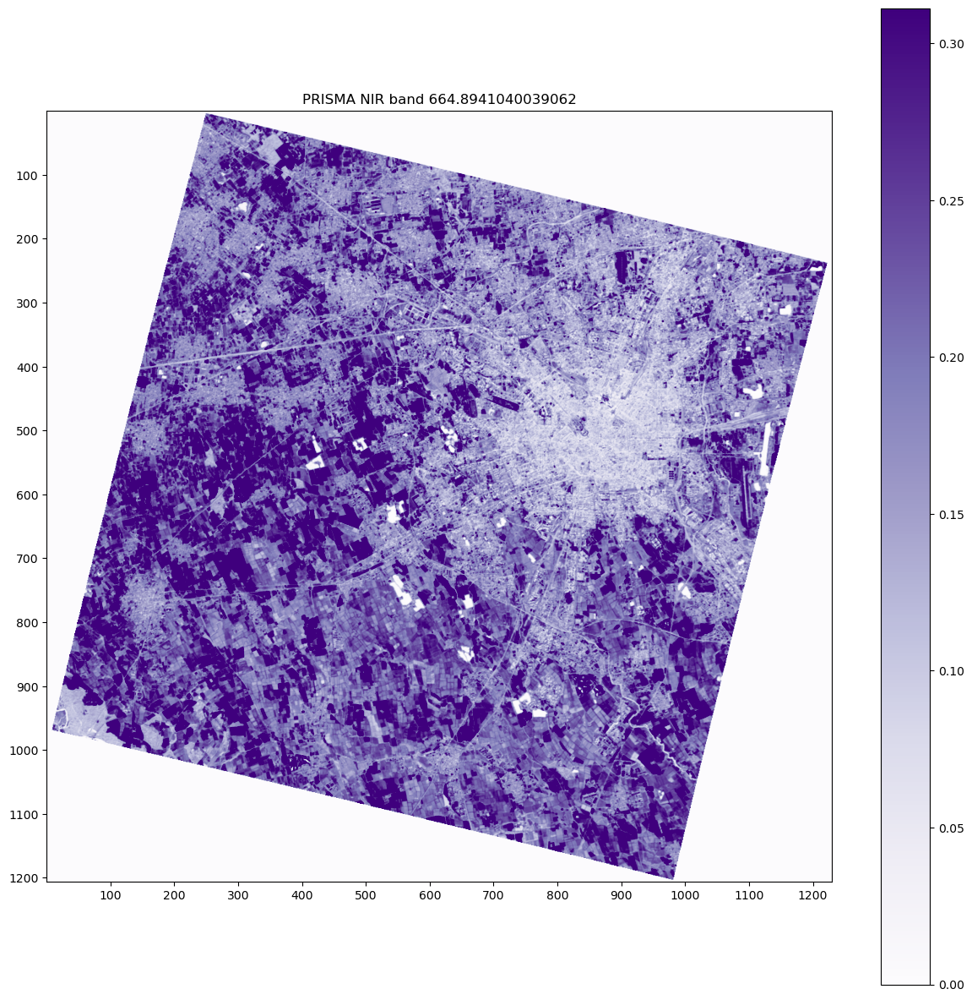

In [99]:
plt.figure(figsize = (15,15))
height, width = nir_band_prisma.shape
extent = [0, width, height, 0]  # left, right, bottom, top
plt.imshow(nir_band_prisma, cmap="Purples", vmin=-np.quantile(nir_band_prisma, 0.1), vmax=np.quantile(nir_band_prisma, 0.9), extent=extent)

plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True, prune='both', nbins=width//100+1))
plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True, prune='both', nbins=height//100+1))
plt.title(f'PRISMA NIR band {vnir_dict[idx_red]}')
plt.colorbar()

'''NIR Band stored in a dedicated array'''
PRISMA_NirBand = nir_band_prisma

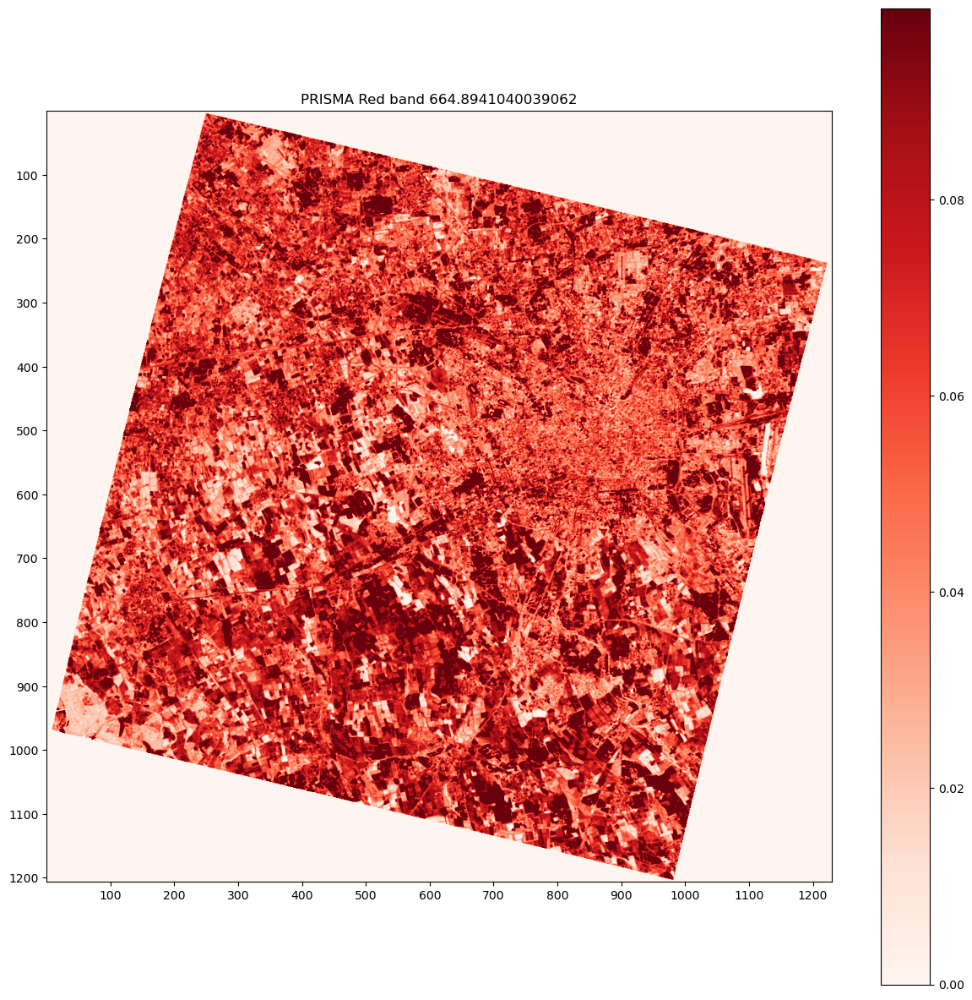

In [100]:
plt.figure(figsize = (15,15))
height, width = red_band_prisma.shape
extent = [0, width, height, 0]  # left, right, bottom, top
plt.imshow(red_band_prisma, cmap="Reds", vmin=-np.quantile(red_band_prisma, 0.1), vmax=np.quantile(red_band_prisma, 0.9), extent=extent)

plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True, prune='both', nbins=width//100+1))
plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True, prune='both', nbins=height//100+1))
plt.title(f'PRISMA Red band {vnir_dict[idx_red]}')
plt.colorbar()

'''Red Band stored in a dedicated array'''
PRISMA_RedBand = red_band_prisma

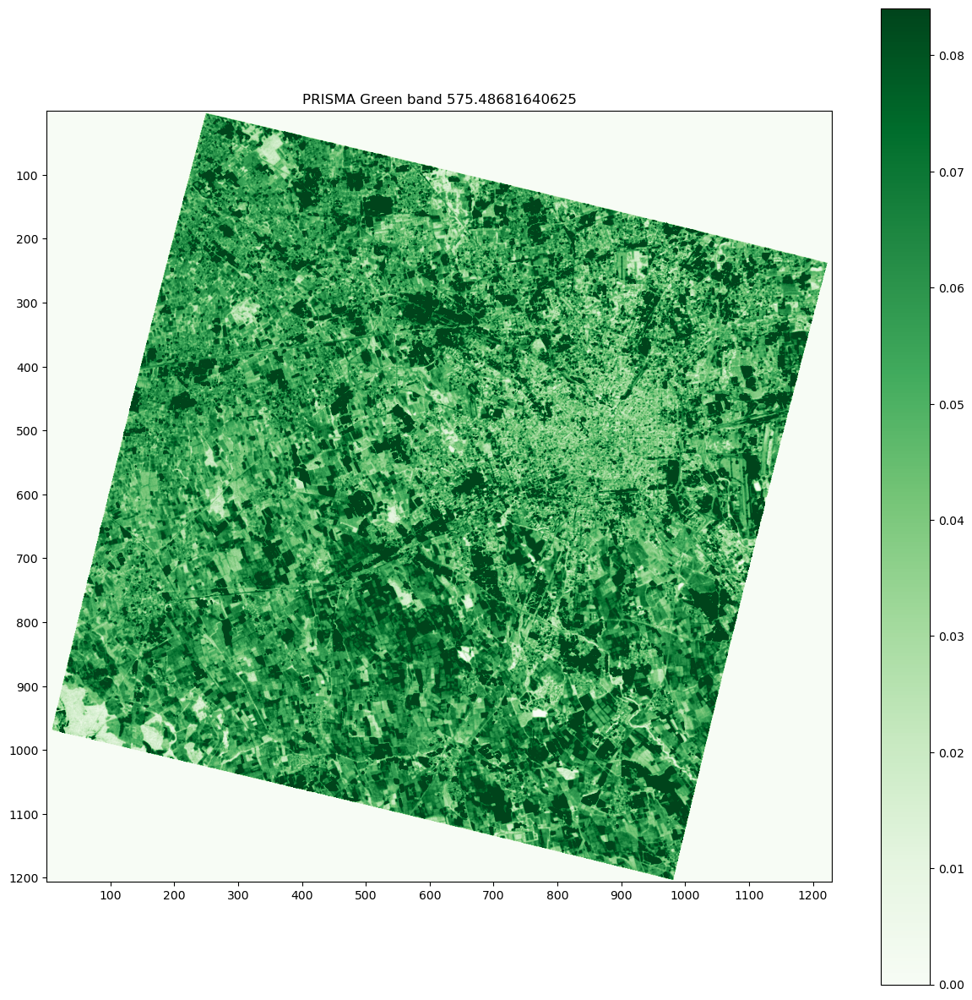

In [101]:
plt.figure(figsize = (15,15))
height, width = green_band_prisma.shape
extent = [0, width, height, 0]  # left, right, bottom, top
plt.imshow(green_band_prisma, cmap="Greens", vmin=-np.quantile(green_band_prisma, 0.1), vmax=np.quantile(green_band_prisma, 0.9), extent=extent)

plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True, prune='both', nbins=width//100+1))
plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True, prune='both', nbins=height//100+1))
plt.title(f'PRISMA Green band {vnir_dict[idx_green]}')
plt.colorbar()

'''Red Band stored in a dedicated array'''
PRISMA_GreenBand = green_band_prisma

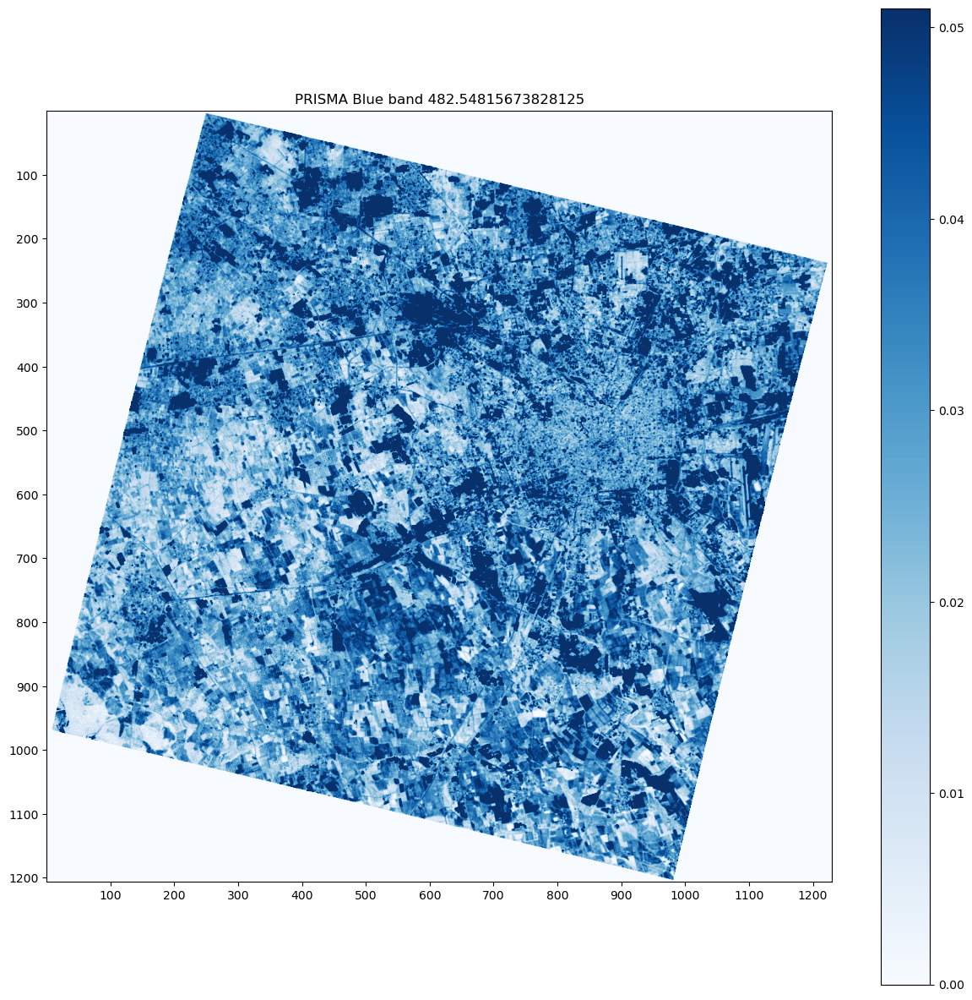

In [102]:
plt.figure(figsize = (15,15))
height, width = blue_band_prisma.shape
extent = [0, width, height, 0]  # left, right, bottom, top
plt.imshow(blue_band_prisma, cmap="Blues", vmin=-np.quantile(blue_band_prisma, 0.1), vmax=np.quantile(blue_band_prisma, 0.9), extent=extent)

plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True, prune='both', nbins=width//100+1))
plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True, prune='both', nbins=height//100+1))
plt.title(f'PRISMA Blue band {vnir_dict[idx_blue]}')
plt.colorbar()

'''Blue Band stored in a dedicated array'''
PRISMA_BlueBand = blue_band_prisma

## 2. <a id='sec2'></a>Importing the pre-processed Sentinel-2 image clipped to PRISMA image extent, resampled and with reflectance scaled
[Back to top](#TOC_TOP)

Let's import the pre-processed Sentinel-2 image

In [103]:
s2_path = "data/S2Clipped/s2_clipped_Q.tif"
sentinel_file=rio.open(s2_path)

In [104]:
Sentinel2_RedBand = sentinel_file.read(3)
Sentinel2_GreenBand = sentinel_file.read(2)
Sentinel2_BlueBand = sentinel_file.read(1)

In [105]:
sentinel_file.shape

(1796, 1823)

Plot Sentinel-2 Bands:

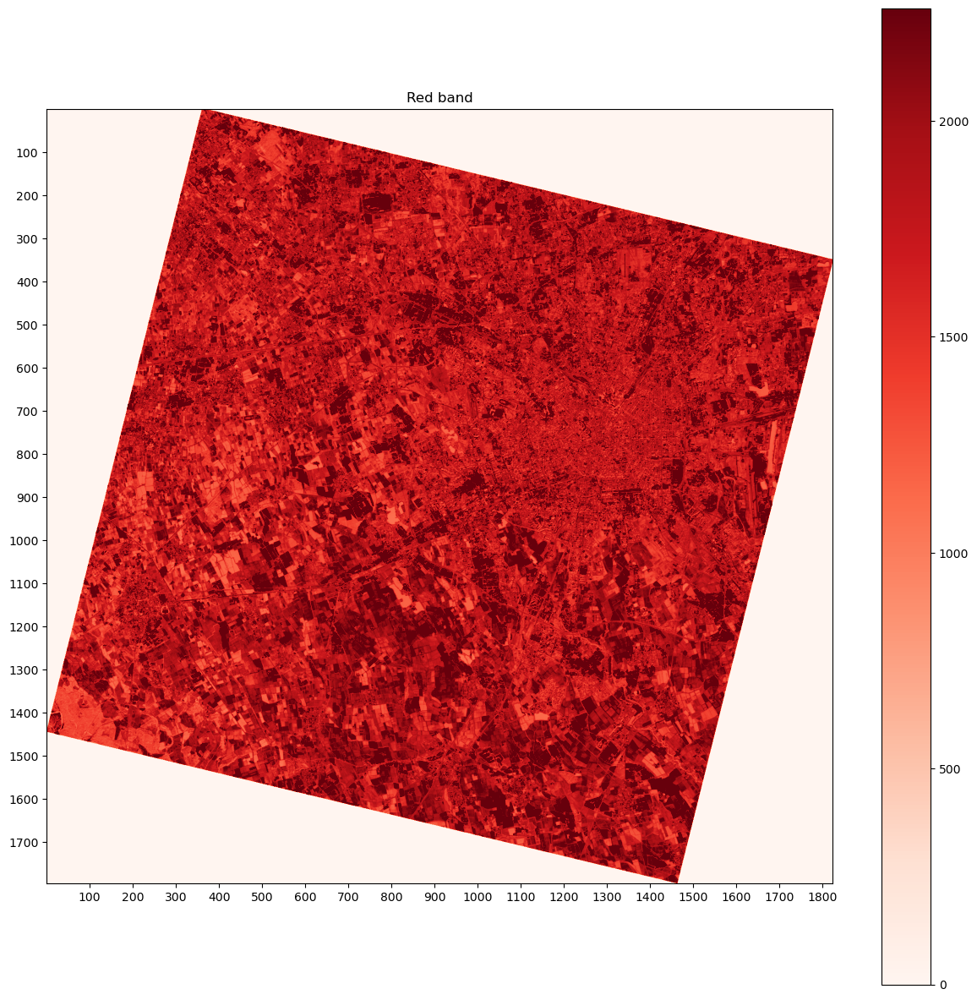

In [106]:
plt.figure(figsize = (15,15))
height, width = Sentinel2_RedBand.shape
extent = [0, width, height, 0]  # left, right, bottom, top
plt.imshow(Sentinel2_RedBand, cmap="Reds", vmin=-np.quantile(Sentinel2_RedBand, 0.1), vmax=np.quantile(Sentinel2_RedBand, 0.9), extent=extent)

plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True, prune='both', nbins=width//100+1))
plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True, prune='both', nbins=height//100+1))
plt.title('Red band')
plt.colorbar()

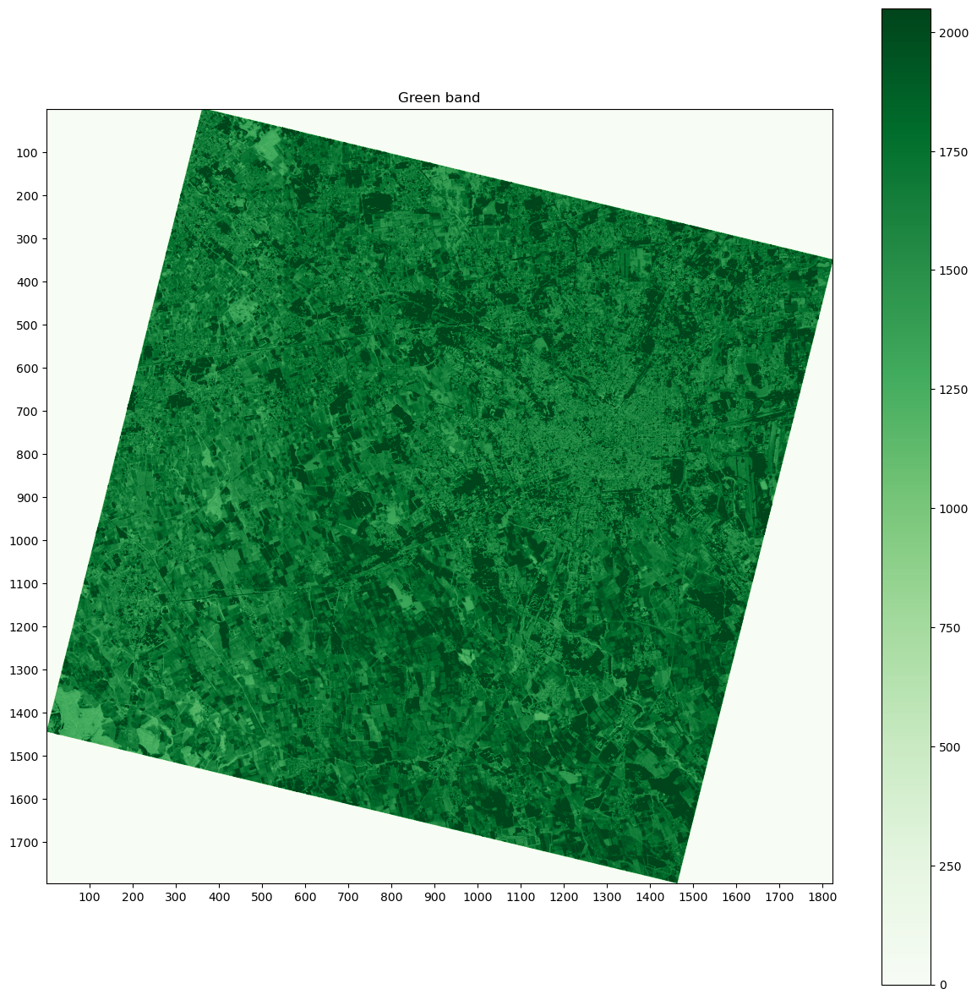

In [107]:
plt.figure(figsize = (15,15))
height, width = Sentinel2_GreenBand.shape
extent = [0, width, height, 0]  # left, right, bottom, top
plt.imshow(Sentinel2_GreenBand, cmap="Greens", vmin=-np.quantile(Sentinel2_GreenBand, 0.1), vmax=np.quantile(Sentinel2_GreenBand, 0.9), extent=extent)

plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True, prune='both', nbins=width//100+1))
plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True, prune='both', nbins=height//100+1))
plt.title('Green band')
plt.colorbar()

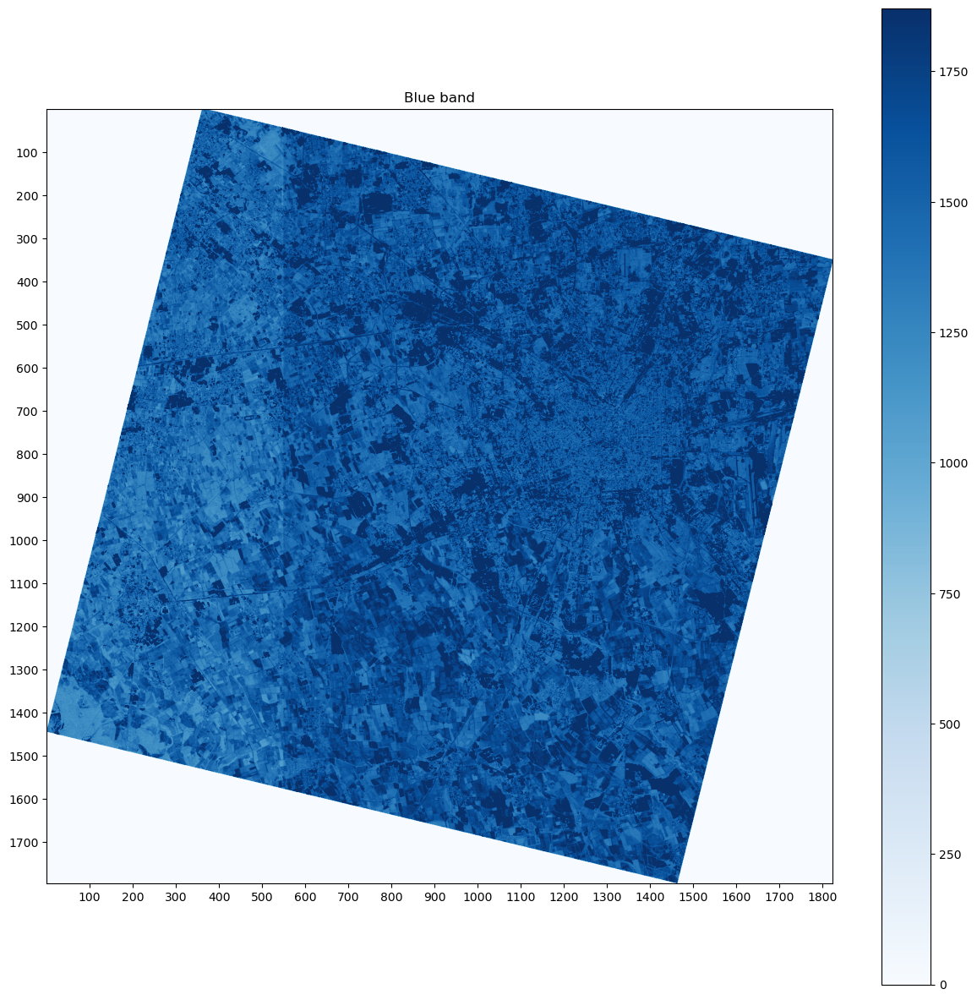

In [108]:
plt.figure(figsize = (15,15))
height, width = Sentinel2_BlueBand.shape
extent = [0, width, height, 0]  # left, right, bottom, top
plt.imshow(Sentinel2_BlueBand, cmap="Blues", vmin=-np.quantile(Sentinel2_BlueBand, 0.1), vmax=np.quantile(Sentinel2_BlueBand, 0.9), extent=extent)

plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True, prune='both', nbins=width//100+1))
plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True, prune='both', nbins=height//100+1))
plt.title('Blue band')
plt.colorbar()

## 3. <a id='sec3'></a>Application of AROSICS algorithm
[Back to top](#TOC_TOP)

Automated and Robust Open-Source Image Co-Registration Software (AROSICS) is a Python based and open-source software for a sub-pixel co-registration for remote sensing datasets. This method uses phase correlation to estimate sub-pixel shifts in the frequency domain using the Fourier shift theorem in a moving-window manner 


Firstly, let's define the parameters required by the algorithm. These values yield good results, however, it is possible to tune them !


In [109]:
bands_dict_PRISMA = {'Blue':PRISMA_BlueBand,
              'Green':PRISMA_GreenBand,
              'Red':PRISMA_RedBand,
              'NIR':PRISMA_NirBand}

bands_dict_S2 = {'Blue':Sentinel2_BlueBand,
              'Green':Sentinel2_GreenBand,
              'Red':Sentinel2_RedBand}
              #'NIR':Sentinel2_NirBand}

The following piece of code applies the algorithm. The result is the estimated horizontal (u) and vertical (v) displacement. (REMINDER: the zeros outside the PRISMA image are intentionally left. Using np.nan gives some issues when processing with GeFolki algorithm):

In [110]:
#band coregistration

crkwargs = {
    'grid_res'     : 30,
    'window_size'  : (64,64),
    'path_out'     : 'auto',
    'tieP_filter_level':3,
    'min_reliability': 60,
    'q'            : False,
}

refrence_path = "data/S2Clipped/s2_clip.tif"
target_path = "data/PRISMA/prisma_all_bands_NOTcoreg.tif"
CRL = COREG_LOCAL(refrence_path,
                  target_path,
                  **crkwargs)
CRL.correct_shifts()


c:\Users\Osama\miniconda3\envs\gepro\Lib\site-packages\numpy\core\_methods.py:181: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
Polygonize progress     |===-----------------------------------------------| 6.0% Complete  => 0:00:00

Calculating footprint polygon and actual data corner coordinates for reference image...


Polygonize progress     |==================================================| 100.0% Complete  => 0:00:00
Polygonize progress     |--------------------------------------------------| 0.0% Complete  => 0:00:00

Bounding box of calculated footprint for reference image:
	(488994.2539999997, 5014317.6416, 525464.6747011681, 5050248.2041)
Automatically detected nodata value for GeoArray_CoReg 'prisma_all_bands_NOTcoreg': 0.0
Calculating footprint polygon and actual data corner coordinates for image to be shifted...


Polygonize progress     |==================================================| 100.0% Complete  => 0:00:00


Bounding box of calculated footprint for image to be shifted:
	(489240.0, 5014150.0, 525660.0, 5050150.0)
Matching window position (X,Y): 507333.9542610811/5032251.360730213
Initializing tie points grid...


Warping progress     |==============------------------------------------| 27.1% Complete  => 0:00:00

Equalizing pixel grids and projections of reference and target image...


Warping progress     |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |==================================================| 100.0% Complete  => 0:00:00


Calculating tie point grid (1096 points) using 4 CPU cores...


	progress: |==================================================| 100.0% Complete  => 0:01:52


Found 26 matches.
Performing validity checks...
6 tie points flagged by level 1 filtering (reliability).
2 tie points flagged by level 2 filtering (SSIM).
2 tie points flagged by level 3 filtering (RANSAC)


c:\Users\Osama\miniconda3\envs\gepro\Lib\site-packages\arosics\Tie_Point_Grid.py:1196: FutureWarning: `random_state` is a deprecated argument name for `ransac`. It will be removed in version 0.23. Please use `rng` instead.
  ransac((src_coords, est_coords),


18 valid tie points remain after filtering.
Automatically detected nodata value for GeoArray 'prisma_all_bands_NOTcoreg': 0.0
Correcting geometric shifts...


c:\Users\Osama\miniconda3\envs\gepro\Lib\site-packages\arosics\DeShifter.py:291: UserWarning: 
The coordinate grid of prisma_all_bands_NOTcoreg cannot be aligned to the desired grid because their pixel sizes are not exact multiples of each other (input [X/Y]: 30.0/30.0; desired [X/Y]: 19.99474819144234/19.99474819097668). Therefore the original grid is chosen for the resampled output image. If you don´t like that you can use the 'out_gsd' or 'match_gsd' parameters to set an appropriate output pixel size or to allow changing the pixel size.

  warnings.warn("\nThe coordinate grid of %s cannot be aligned to the desired grid because their pixel "
Translating progress |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |==================================================| 100.0% Complete  => 0:00:01


Writing GeoArray of size (1206, 1230, 4) to c:\Users\Osama\Documents\GitHub\GeoinformaticsProject\data\PRISMA\prisma_all_bands_NOTcoreg__shifted_to__s2_clip.bsq.


OrderedDict([('band', None),
             ('is shifted', True),
             ('is resampled', True),
             ('updated map info',
              ['UTM',
               1.0,
               1.0,
               489000.0,
               5050240.0,
               30.0,
               30.0,
               32,
               'North',
               'WGS-84']),
             ('updated geotransform',
              (489000.0, 30.0, 0.0, 5050240.0, 0.0, -30.0)),
             ('updated projection',
              'PROJCS["WGS 84 / UTM zone 32N",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",9],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG

Note: array has been downsampled to 1000 x 985 for faster visualization.


c:\Users\Osama\miniconda3\envs\gepro\Lib\site-packages\numpy\core\_methods.py:215: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


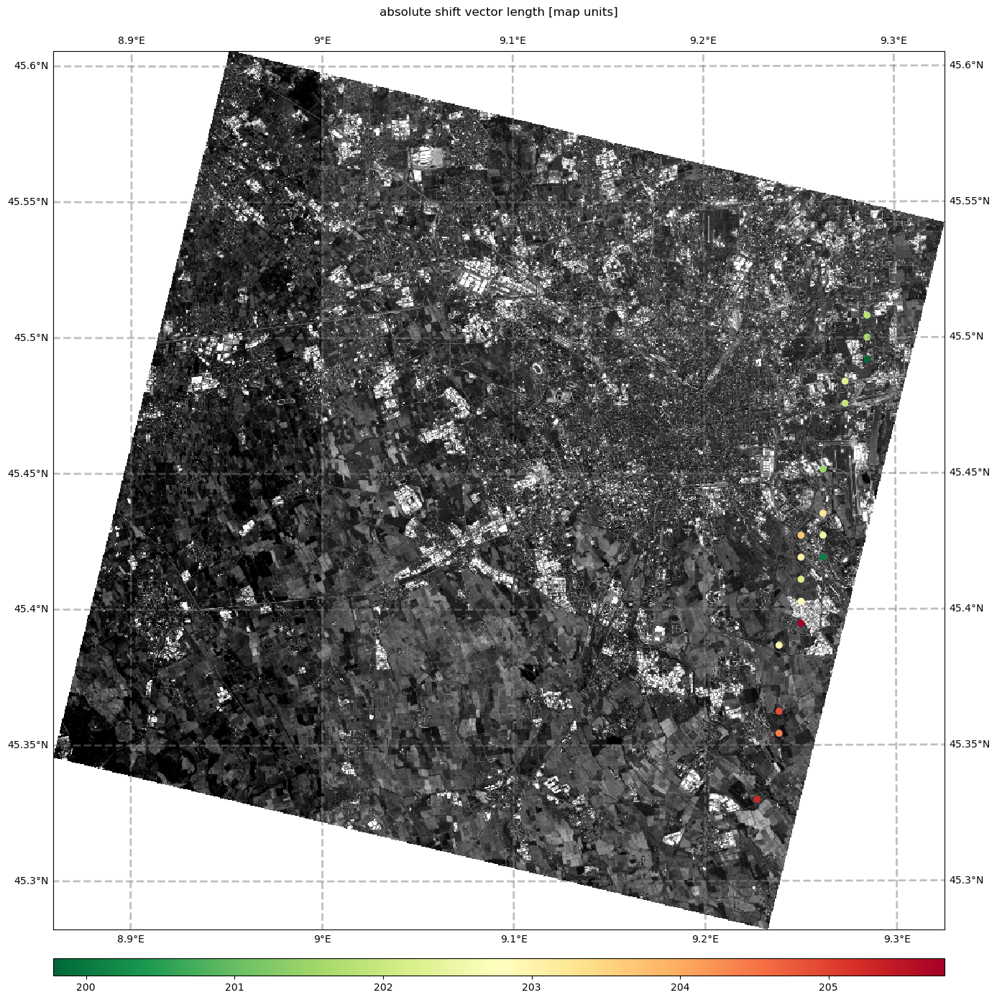

In [111]:
CRL.view_CoRegPoints(figsize=(15,15), backgroundIm='ref')

This line of code shows the overlap between the processed images and how much they align 

In [112]:
CRL.show_image_footprints()

Display tiepoints table Before coregistration process

In [113]:
CRL.CoRegPoints_table

,geometry,POINT_ID,X_IM,Y_IM,X_MAP,Y_MAP,REF_BADDATA,TGT_BADDATA,X_WIN_SIZE,Y_WIN_SIZE,...,ANGLE,SSIM_BEFORE,SSIM_AFTER,SSIM_IMPROVED,RELIABILITY,LAST_ERR,L1_OUTLIER,L2_OUTLIER,L3_OUTLIER,OUTLIER
0,POINT (497100.000 5049340.000),51,270,30,497100.0,5049340.0,False,False,36.0,34.0,...,-9999.0,-9999.0,-9999.0,-9999,-9999.0,The calculated shift (X: -8.334978742912117 px...,-9999,-9999,-9999,-9999
1,POINT (498000.000 5049340.000),52,300,30,498000.0,5049340.0,False,False,24.0,22.0,...,-9999.0,-9999.0,-9999.0,-9999,-9999.0,No match found in the given window.,-9999,-9999,-9999,-9999
2,POINT (498900.000 5049340.000),53,330,30,498900.0,5049340.0,False,False,-9999.0,-9999.0,...,-9999.0,-9999.0,-9999.0,-9999,-9999.0,One of the input images does not have sufficie...,-9999,-9999,-9999,-9999
3,POINT (499800.000 5049340.000),54,360,30,499800.0,5049340.0,False,False,-9999.0,-9999.0,...,-9999.0,-9999.0,-9999.0,-9999,-9999.0,One of the input images does not have sufficie...,-9999,-9999,-9999,-9999
4,POINT (496200.000 5048440.000),92,240,60,496200.0,5048440.0,False,False,-9999.0,-9999.0,...,-9999.0,-9999.0,-9999.0,-9999,-9999.0,One of the input images does not have sufficie...,-9999,-9999,-9999,-9999
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1091,POINT (517800.000 5016040.000),1628,960,1140,517800.0,5016040.0,False,False,44.0,44.0,...,-9999.0,-9999.0,-9999.0,-9999,-9999.0,The calculated shift (X: -4.6170801271124065 p...,-9999,-9999,-9999,-9999
1092,POINT (515100.000 5015140.000),1667,870,1170,515100.0,5015140.0,False,False,-9999.0,-9999.0,...,-9999.0,-9999.0,-9999.0,-9999,-9999.0,One of the input images does not have sufficie...,-9999,-9999,-9999,-9999
1093,POINT (516000.000 5015140.000),1668,900,1170,516000.0,5015140.0,False,False,-9999.0,-9999.0,...,-9999.0,-9999.0,-9999.0,-9999,-9999.0,One of the input images does not have sufficie...,-9999,-9999,-9999,-9999
1094,POINT (516900.000 5015140.000),1669,930,1170,516900.0,5015140.0,False,False,26.0,24.0,...,-9999.0,-9999.0,-9999.0,-9999,-9999.0,No match found in the given window.,-9999,-9999,-9999,-9999


In [114]:
#Display all of the 25 clumns in the table to explore the data in hand
CRL.CoRegPoints_table.columns

Index(['geometry', 'POINT_ID', 'X_IM', 'Y_IM', 'X_MAP', 'Y_MAP', 'REF_BADDATA',
       'TGT_BADDATA', 'X_WIN_SIZE', 'Y_WIN_SIZE', 'X_SHIFT_PX', 'Y_SHIFT_PX',
       'X_SHIFT_M', 'Y_SHIFT_M', 'ABS_SHIFT', 'ANGLE', 'SSIM_BEFORE',
       'SSIM_AFTER', 'SSIM_IMPROVED', 'RELIABILITY', 'LAST_ERR', 'L1_OUTLIER',
       'L2_OUTLIER', 'L3_OUTLIER', 'OUTLIER'],
      dtype='object')

The remaining shifts after local correction can be calculated and visualized by instanciating the arosics.COREG_LOCAL with the output path of the above instance of COREG_LOCAL.

c:\Users\Osama\miniconda3\envs\gepro\Lib\site-packages\numpy\core\_methods.py:181: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)


Calculating footprint polygon and actual data corner coordinates for reference image...


Polygonize progress     |==================================================| 100.0% Complete  => 0:00:00
Polygonize progress     |=======================---------------------------| 46.0% Complete  => 0:00:00

Bounding box of calculated footprint for reference image:
	(488994.2539999997, 5014317.6416, 525464.6747011681, 5050248.2041)
Calculating footprint polygon and actual data corner coordinates for image to be shifted...


Polygonize progress     |==================================================| 100.0% Complete  => 0:00:00


Bounding box of calculated footprint for image to be shifted:
	(489000.0, 5014300.0, 525540.0, 5050120.0)
Matching window position (X,Y): 507228.5695669921/5032266.523038246
Note: array has been downsampled to 1000 x 985 for faster visualization.
Initializing tie points grid...


c:\Users\Osama\miniconda3\envs\gepro\Lib\site-packages\numpy\core\_methods.py:215: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)
Warping progress     |=================---------------------------------| 34.0% Complete  => 0:00:00

Equalizing pixel grids and projections of reference and target image...


Warping progress     |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |==================================================| 100.0% Complete  => 0:00:00


Calculating tie point grid (1099 points) using 4 CPU cores...


	progress: |==================================================| 100.0% Complete  => 0:03:09


Found 1020 matches.
Performing validity checks...
117 tie points flagged by level 1 filtering (reliability).
121 tie points flagged by level 2 filtering (SSIM).


c:\Users\Osama\miniconda3\envs\gepro\Lib\site-packages\arosics\Tie_Point_Grid.py:1196: FutureWarning: `random_state` is a deprecated argument name for `ransac`. It will be removed in version 0.23. Please use `rng` instead.
  ransac((src_coords, est_coords),


168 tie points flagged by level 3 filtering (RANSAC)
624 valid tie points remain after filtering.


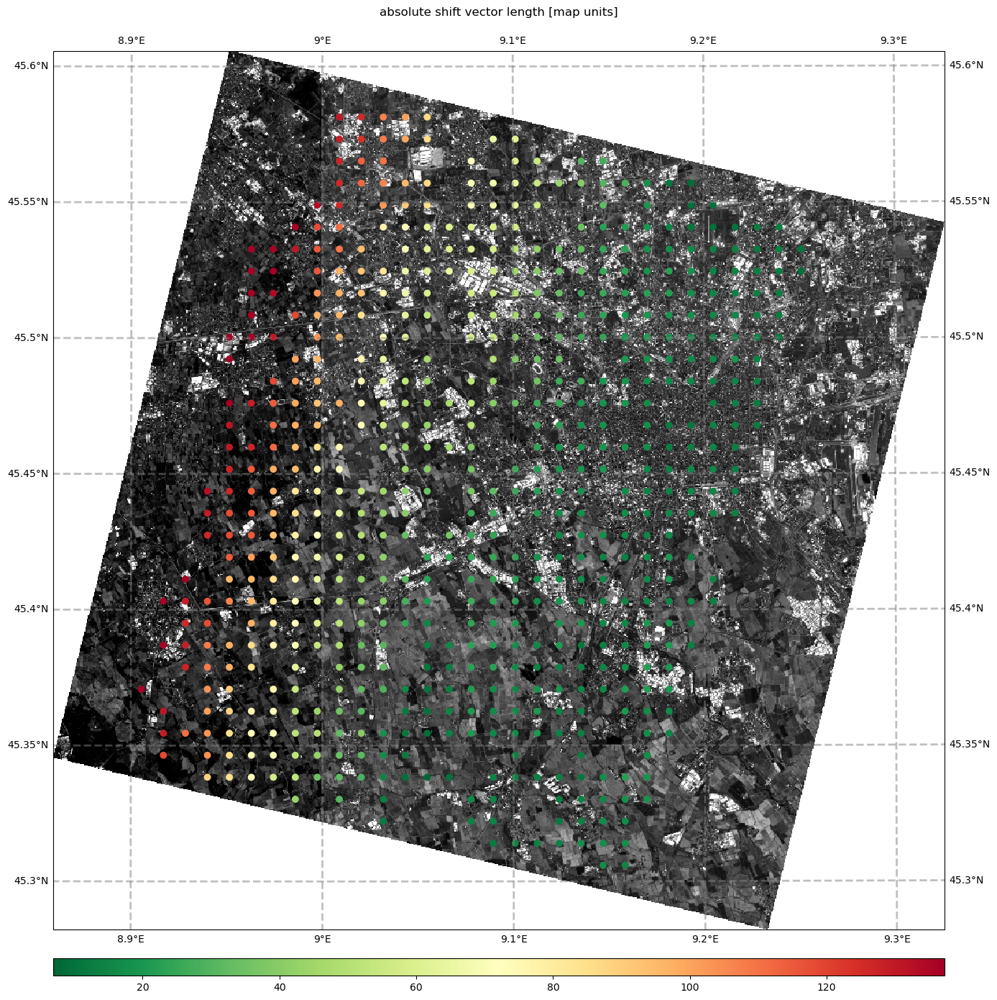

In [115]:
CRL_after_corr = COREG_LOCAL(refrence_path, CRL.path_out, **crkwargs)
# visualize tie point grid with shifts present AFTER correction

CRL_after_corr.view_CoRegPoints(figsize=(15,15),backgroundIm='ref')

Display tiepoints table after coregistration process

In [116]:
CRL_after_corr.CoRegPoints_table

,geometry,POINT_ID,X_IM,Y_IM,X_MAP,Y_MAP,REF_BADDATA,TGT_BADDATA,X_WIN_SIZE,Y_WIN_SIZE,...,ANGLE,SSIM_BEFORE,SSIM_AFTER,SSIM_IMPROVED,RELIABILITY,LAST_ERR,L1_OUTLIER,L2_OUTLIER,L3_OUTLIER,OUTLIER
0,POINT (496200.000 5049340.000),50,240,30,496200.0,5049340.0,False,False,-9999.0,-9999.0,...,-9999.000000,-9999.000000,-9999.000000,-9999,-9999.000000,One of the input images does not have sufficie...,-9999,-9999,-9999,-9999
1,POINT (497100.000 5049340.000),51,270,30,497100.0,5049340.0,False,False,30.0,28.0,...,-9999.000000,-9999.000000,-9999.000000,-9999,-9999.000000,No match found in the given window.,-9999,-9999,-9999,-9999
2,POINT (498000.000 5049340.000),52,300,30,498000.0,5049340.0,False,False,18.0,16.0,...,-9999.000000,-9999.000000,-9999.000000,-9999,-9999.000000,The matching window became too small for calcu...,-9999,-9999,-9999,-9999
3,POINT (498900.000 5049340.000),53,330,30,498900.0,5049340.0,False,False,-9999.0,-9999.0,...,-9999.000000,-9999.000000,-9999.000000,-9999,-9999.000000,One of the input images does not have sufficie...,-9999,-9999,-9999,-9999
4,POINT (496200.000 5048440.000),92,240,60,496200.0,5048440.0,False,False,22.0,22.0,...,-9999.000000,-9999.000000,-9999.000000,-9999,-9999.000000,No match found in the given window.,-9999,-9999,-9999,-9999
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1094,POINT (517800.000 5016040.000),1628,960,1140,517800.0,5016040.0,False,False,44.0,44.0,...,212.018524,0.608605,0.647178,True,65.068280,-9999,False,False,True,True
1095,POINT (515100.000 5015140.000),1667,870,1170,515100.0,5015140.0,False,False,-9999.0,-9999.0,...,-9999.000000,-9999.000000,-9999.000000,-9999,-9999.000000,One of the input images does not have sufficie...,-9999,-9999,-9999,-9999
1096,POINT (516000.000 5015140.000),1668,900,1170,516000.0,5015140.0,False,False,-9999.0,-9999.0,...,-9999.000000,-9999.000000,-9999.000000,-9999,-9999.000000,One of the input images does not have sufficie...,-9999,-9999,-9999,-9999
1097,POINT (516900.000 5015140.000),1669,930,1170,516900.0,5015140.0,False,False,26.0,24.0,...,220.523053,0.874781,0.859002,False,34.028028,-9999,True,True,False,True


In [117]:
#Display all of the 25 clumns in the table to explore the data in hand
CRL_after_corr.CoRegPoints_table.columns

Index(['geometry', 'POINT_ID', 'X_IM', 'Y_IM', 'X_MAP', 'Y_MAP', 'REF_BADDATA',
       'TGT_BADDATA', 'X_WIN_SIZE', 'Y_WIN_SIZE', 'X_SHIFT_PX', 'Y_SHIFT_PX',
       'X_SHIFT_M', 'Y_SHIFT_M', 'ABS_SHIFT', 'ANGLE', 'SSIM_BEFORE',
       'SSIM_AFTER', 'SSIM_IMPROVED', 'RELIABILITY', 'LAST_ERR', 'L1_OUTLIER',
       'L2_OUTLIER', 'L3_OUTLIER', 'OUTLIER'],
      dtype='object')

In [118]:
#calculate stats before correction
CRL.tiepoint_grid.calc_overall_stats()

{'N_TP': 26,
 'N_VALID_TP': 18,
 'N_INVALID_TP': 8,
 'PERC_VALID_TP': 69.23076923076923,
 'RMSE_M': 202.78716039668188,
 'RMSE_X_M': 143.9106901932664,
 'RMSE_Y_M': 142.8717805231225,
 'RMSE_X_PX': 4.7970230064422825,
 'RMSE_Y_PX': 4.762392684102807,
 'MSE_M': 41122.632421749586,
 'MSE_X_M': 20710.286751902302,
 'MSE_Y_M': 20412.345669847287,
 'MSE_X_PX': 23.01142972433656,
 'MSE_Y_PX': 22.68038407759593,
 'MAE_M': 202.7807510363934,
 'MAE_X_M': 143.88807577577407,
 'MAE_Y_M': 142.84968829382626,
 'MAE_X_PX': 4.796269192525873,
 'MAE_Y_PX': 4.761656276459597,
 'MEAN_ABS_SHIFT': 202.78075103639338,
 'MEAN_X_SHIFT_M': -143.88807577577407,
 'MEAN_Y_SHIFT_M': 142.84968829382626,
 'MEAN_X_SHIFT_PX': -4.796269192525873,
 'MEAN_Y_SHIFT_PX': -4.761656276459597,
 'MEAN_ANGLE': 134.79272084303014,
 'MEAN_SSIM_BEFORE': 0.17756850130174437,
 'MEAN_SSIM_AFTER': 0.7369506238679958,
 'MEAN_RELIABILITY': 64.65327342580335,
 'MEDIAN_ABS_SHIFT': 202.6820436670439,
 'MEDIAN_X_SHIFT_M': -144.0162770544411

This Part shows the distribution of tie points considering the sifts Before the coregistration 

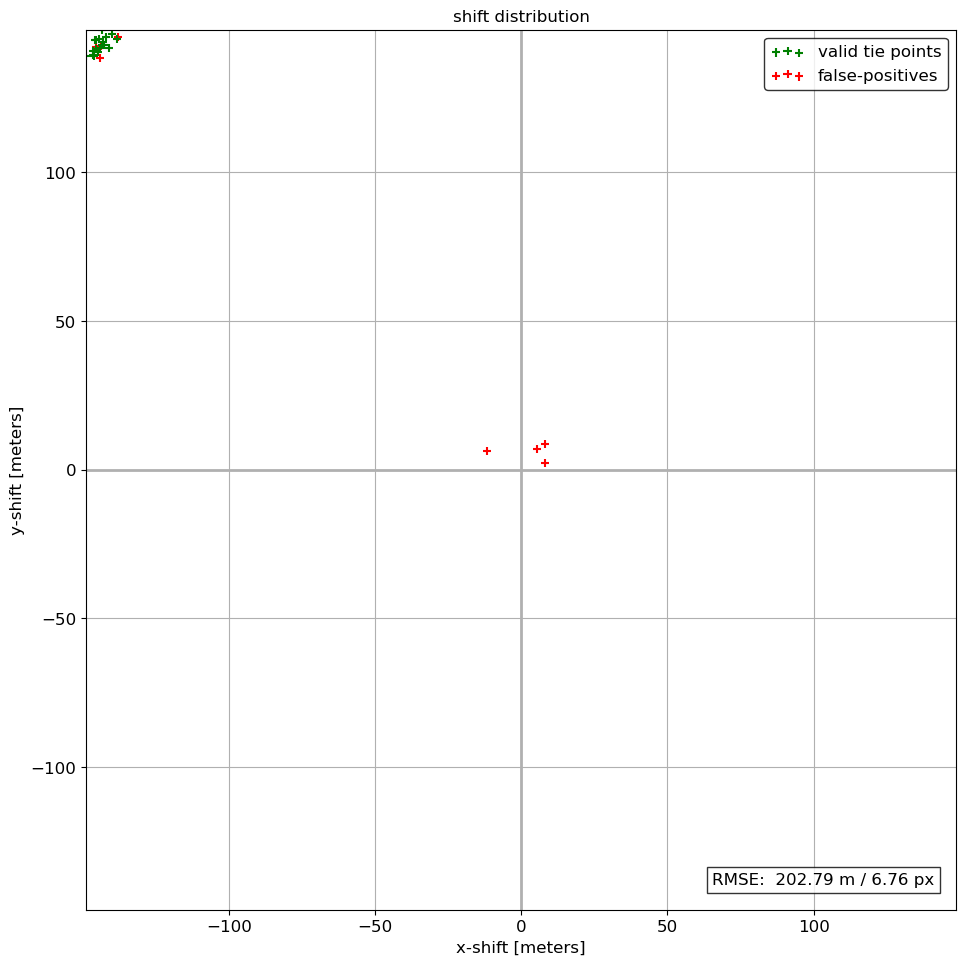

In [119]:
CRL.tiepoint_grid.plot_shift_distribution(include_outliers=True)

In [120]:
#calculate stats After correction
CRL_after_corr.tiepoint_grid.calc_overall_stats()

{'N_TP': 1020,
 'N_VALID_TP': 624,
 'N_INVALID_TP': 396,
 'PERC_VALID_TP': 61.1764705882353,
 'RMSE_M': 60.813338879806054,
 'RMSE_X_M': 42.57657733079205,
 'RMSE_Y_M': 43.42231279544205,
 'RMSE_X_PX': 1.4192192443597342,
 'RMSE_Y_PX': 1.447410426514994,
 'MSE_M': 3698.262185710131,
 'MSE_X_M': 1812.7649372049152,
 'MSE_Y_M': 1885.4972485052106,
 'MSE_X_PX': 2.014183263561015,
 'MSE_Y_PX': 2.0949969427843174,
 'MAE_M': 47.53184987329261,
 'MAE_X_M': 33.6083383104174,
 'MAE_Y_M': 31.787255294956804,
 'MAE_X_PX': 1.1202779436805828,
 'MAE_Y_PX': 1.0595751764988954,
 'MEAN_ABS_SHIFT': 47.531849873292636,
 'MEAN_X_SHIFT_M': 31.265950082399424,
 'MEAN_Y_SHIFT_M': 21.199590562112952,
 'MEAN_X_SHIFT_PX': 1.0421983360799827,
 'MEAN_Y_SHIFT_PX': -0.7066530187370699,
 'MEAN_ANGLE': 220.6475399030902,
 'MEAN_SSIM_BEFORE': 0.46711814440900323,
 'MEAN_SSIM_AFTER': 0.70587608404916,
 'MEAN_RELIABILITY': 72.27312937487206,
 'MEDIAN_ABS_SHIFT': 31.3426445747863,
 'MEDIAN_X_SHIFT_M': 25.25629934106837,

This Part shows the distribution of tie points considering the sifts after the coregistration 

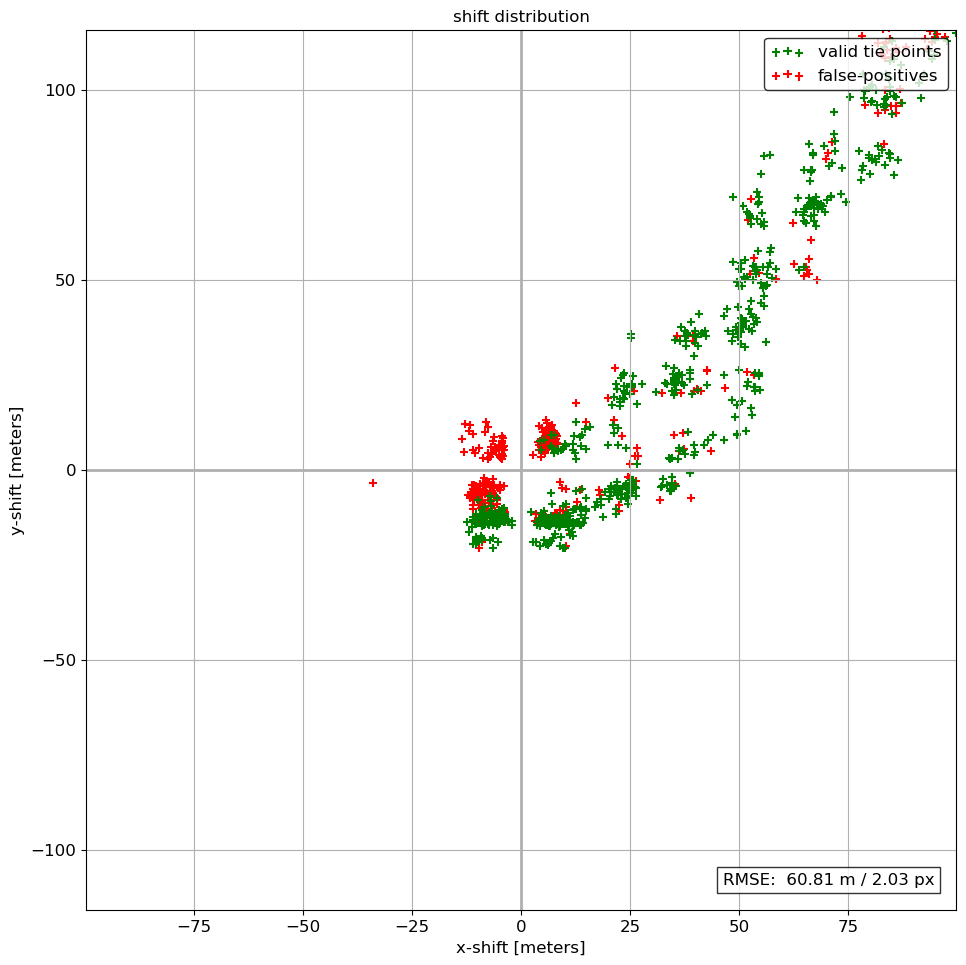

In [121]:
CRL_after_corr .tiepoint_grid.plot_shift_distribution(include_outliers=True)

Here we explore some stats of the data before and after the coregistration

In [122]:
print(f"Before coregistration - Mean of x: {CRL.tiepoint_grid.mean_x_shift_px:.2f} ")
print(f"After coregistration - Mean of x: {CRL_after_corr.tiepoint_grid.mean_x_shift_px:.2f} ")
print(f"Before coregistration - Mean of y: {CRL.tiepoint_grid.mean_y_shift_px:.2f} ")
print(f"After coregistration - Mean of y: {CRL_after_corr.tiepoint_grid.mean_y_shift_px:.2f} ")
print(f"Before coregistration - RMSE (m): {CRL.tiepoint_grid.calc_rmse():.2f} ")
print(f"After coregistration - RMSE (m): {CRL_after_corr.tiepoint_grid.calc_rmse():.2f} ")
print(f"Before coregistration - ABS shift STD (m): {CRL.tiepoint_grid.calc_overall_stats()['STD_ABS_SHIFT']:.2f} ")
print(f"After coregistration - ABS shift STD (m): {CRL_after_corr.tiepoint_grid.calc_overall_stats()['STD_ABS_SHIFT']:.2f} ")

Before coregistration - Mean of x: -4.04 
After coregistration - Mean of x: 1.00 
Before coregistration - Mean of y: -4.06 
After coregistration - Mean of y: -0.87 
Before coregistration - RMSE (m): 202.79 
After coregistration - RMSE (m): 60.81 
Before coregistration - ABS shift STD (m): 1.61 
After coregistration - ABS shift STD (m): 37.93 


In this PArt We may do further iterations and calculate the RMSE between any two of them (OPtional)

In [123]:
# # afunction to calculate RMSE
# def calculate_rmse(detected_shifts_before, detected_shifts_after):
#     # Convert the lists to numpy arrays
#     before = np.array(detected_shifts_before)
#     after = np.array(detected_shifts_after)
    
#     # Calculate the squared differences between before and after
#     squared_diff = np.square(after - before)
    
#     # Calculate the mean of the squared differences
#     mean_squared_diff = np.mean(squared_diff)
    
#     # Calculate the RMSE by taking the square root of the mean squared difference
#     rmse = np.sqrt(mean_squared_diff)
    
#     return rmse

In [124]:
# detected_shifts_before=CRL.tiepoint_grid.calc_overall_stats()['MEAN_ABS_SHIFT']
# detected_shifts_after=CRL_after_corr.tiepoint_grid.calc_overall_stats()['MEAN_ABS_SHIFT']
# rmse_result=calculate_rmse(detected_shifts_before, detected_shifts_after)
# print(f"RMSE Result: {rmse_result:.2f}")